## Environment Setup

In [19]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision
import torchvision.utils as vutils
import torchvision.transforms as transforms
import torchvision.datasets as datasets
import numpy as np
import matplotlib.pyplot as plt
import os
import torchvision.transforms as transforms
from torchvision.datasets import MNIST
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import sys

from fUSi_AmbientGAN import *

## Training on MNIST

In [2]:
# Hyperparameters
noise_dim = 100
batch_size = 64
epochs = 50
lr = 0.0002
num_frames = 1
crop_dim = (28, 28)

# Data loader
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize([0.5], [0.5])
])

mnist = MNIST(root='./data', train=True, transform=transform, download=True)
data_loader = DataLoader(mnist, batch_size=batch_size, shuffle=True)

In [3]:
noise_types = ['mask', \
               'gaussian_noise', \
               'speckle_noise', \
               'thermal_noise', \
               'poisson_noise', \
              #  'quantization_noise', \
               'motion_artifacts', \
              #  'reverberation_artifacts'\
               ]
# Initialize models
generator = MNIST_Generator(noise_dim)
discriminator = MNIST_Discriminator()
corruptor = Corruptor(corruption_types=noise_types)
gan = AmbientGAN(generator, discriminator, corruptor, noise_dim, corrupt=True, output_dir='out/mnist_out')

Displaying Corrupted Images

In [4]:
# Get a batch of data
data_iter = iter(data_loader)
imgs, _ = next(data_iter)

# Corrupt the data
# all_noise_types = ['mask', 'gaussian_noise', 'speckle_noise', 'thermal_noise', \
#                'poisson_noise', 'quantization_noise', 'motion_artifacts', \
#                'reverberation_artifacts', 'electronic_interference']

vis_corruptor = Corruptor(corruption_types=noise_types)
corrupted_imgs = vis_corruptor.corrupt(imgs)

Displaying Real Images

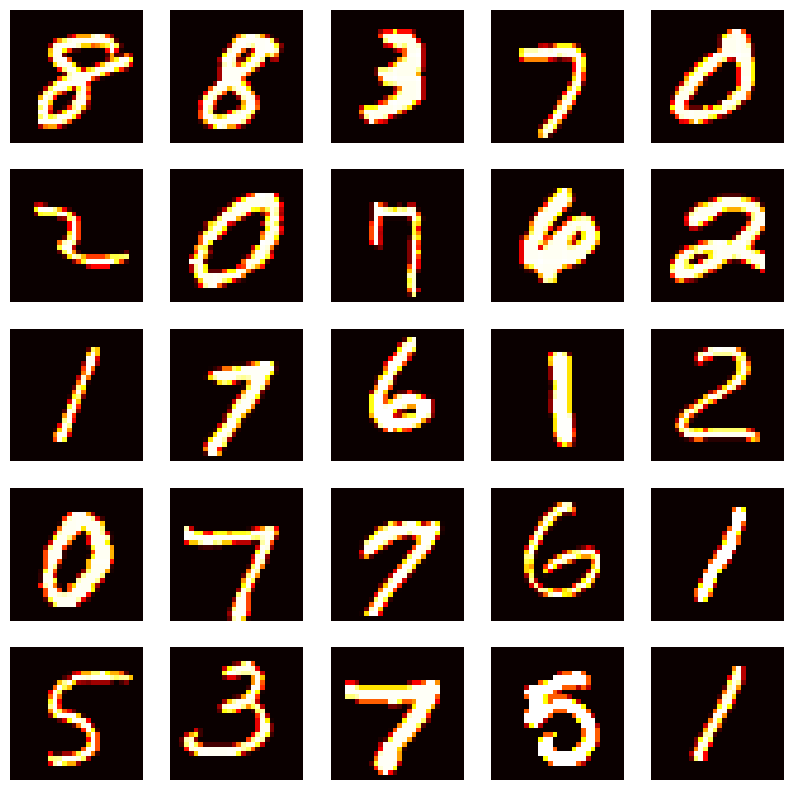

In [5]:
# Visualize the pre-corruption data
plt.figure(figsize=(10, 10))
for i in range(25):
    plt.subplot(5, 5, i+1)
    plt.imshow(imgs[i].numpy().reshape(28, 28), cmap='hot')
    plt.axis('off')
plt.show()

Displaying Corrupt Images

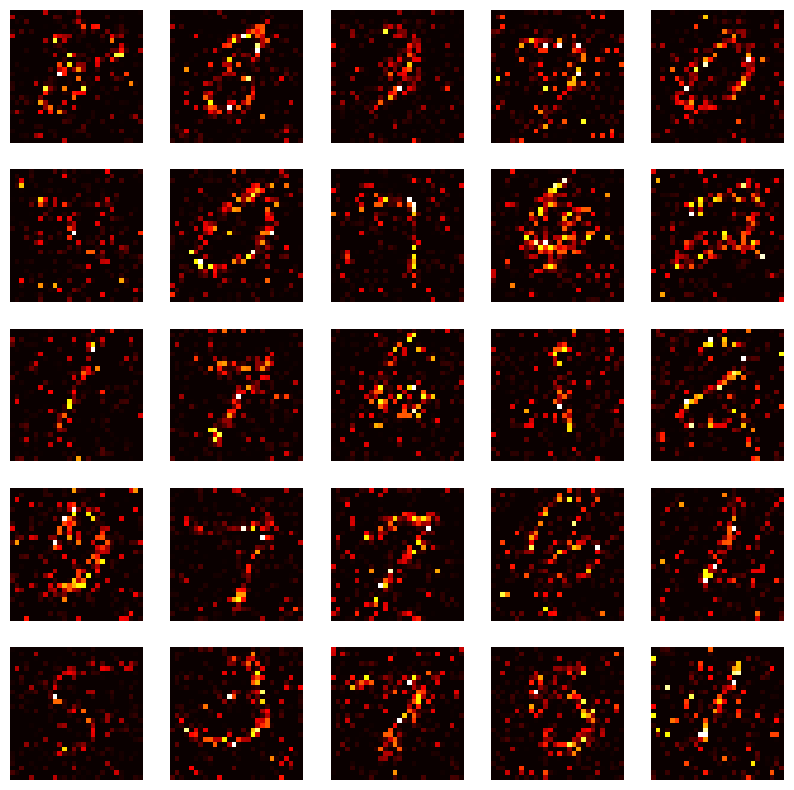

In [6]:
# Visualize the corrupted data
plt.figure(figsize=(10, 10))
for i in range(25):
    plt.subplot(5, 5, i+1)
    plt.imshow(corrupted_imgs[i].numpy().reshape(28, 28), cmap='hot')
    plt.axis('off')
plt.show()

In [7]:
# Train the GAN
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
generator.to(device)
discriminator.to(device)

d_losses, g_losses = gan.train(data_loader, epochs, device)

[Epoch 0/50] [Batch 0/938] [D loss: 0.7006256580352783] [G loss: 0.6146000623703003]
[Epoch 0/50] [Batch 100/938] [D loss: 0.5168678760528564] [G loss: 0.8772909641265869]
[Epoch 0/50] [Batch 200/938] [D loss: 0.4609881341457367] [G loss: 1.2460861206054688]
[Epoch 0/50] [Batch 300/938] [D loss: 0.7791646718978882] [G loss: 0.6664753556251526]
[Epoch 0/50] [Batch 400/938] [D loss: 0.32227614521980286] [G loss: 1.5499708652496338]
[Epoch 0/50] [Batch 500/938] [D loss: 0.607919454574585] [G loss: 0.9725682139396667]


KeyboardInterrupt: 

## Training on CelebA

In [8]:
!wget -O img_align_celeba.zip "https://s3-us-west-1.amazonaws.com/udacity-dlnfd/datasets/celeba.zip"
!unzip img_align_celeba.zip -d ./data/celebA

--2024-06-06 01:57:39--  https://s3-us-west-1.amazonaws.com/udacity-dlnfd/datasets/celeba.zip
Resolving s3-us-west-1.amazonaws.com (s3-us-west-1.amazonaws.com)... 52.219.193.104, 52.219.193.184, 52.219.120.216, ...
Connecting to s3-us-west-1.amazonaws.com (s3-us-west-1.amazonaws.com)|52.219.193.104|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1443490838 (1.3G) [application/zip]
Saving to: ‘img_align_celeba.zip’

img_align_celeba.zi 100%[===================>]   1.34G  75.4MB/s    in 21s     

2024-06-06 01:58:00 (64.7 MB/s) - ‘img_align_celeba.zip’ saved [1443490838/1443490838]

Archive:  img_align_celeba.zip
   creating: ./data/celebA/img_align_celeba/
 extracting: ./data/celebA/img_align_celeba/000001.jpg  
 extracting: ./data/celebA/img_align_celeba/000002.jpg  
 extracting: ./data/celebA/img_align_celeba/000003.jpg  
 extracting: ./data/celebA/img_align_celeba/000004.jpg  
 extracting: ./data/celebA/img_align_celeba/000005.jpg  
 extracting: ./data/celeb

Check to make sure directory exists and files are in order.

In [9]:
# Check if the directory exists and list some files
if os.path.exists('./data/celebA/img_align_celeba'):
    print("Directory exists")
    print("Sample files:", os.listdir('./data/celebA/img_align_celeba')[:5])
else:
    print("Directory does not exist")

Directory exists
Sample files: ['047832.jpg', '067859.jpg', '119882.jpg', '041670.jpg', '031083.jpg']


Load Data

In [10]:
# Create a class folder and move images into it
import shutil

# Create a new directory for the images
class_dir = './data/celebA/img_align_celeba/all_images'
os.makedirs(class_dir, exist_ok=True)

# Move images into the new directory
for img_file in os.listdir('./data/celebA/img_align_celeba'):
    if img_file.endswith('.jpg'):
        shutil.move(os.path.join('./data/celebA/img_align_celeba', img_file), os.path.join(class_dir, img_file))

# Check if the images are moved correctly
print("Number of images in class folder:", len(os.listdir(class_dir)))

Number of images in class folder: 202599


In [11]:
# Parameters
batch_size = 64

# Transforms
transform = transforms.Compose([
    transforms.Resize(64),
    transforms.CenterCrop(64),
    transforms.ToTensor(),
    transforms.Normalize([0.5], [0.5], [0.5])
])

# Dataset and DataLoader
dataset_path = './data/celebA/img_align_celeba'
celebA_dataset = ImageFolder(root=dataset_path, transform=transform)
data_loader = DataLoader(celebA_dataset, batch_size=batch_size, shuffle=True)

In [12]:
# Parameters
batch_size = 64

# Transforms
transform = transforms.Compose([
    transforms.Resize(64),
    transforms.CenterCrop(64),
    transforms.ToTensor(),
    transforms.Normalize([0.5], [0.5], [0.5])
])

# Dataset and DataLoader
dataset_path = './data/celebA/img_align_celeba'
celebA_dataset = ImageFolder(root=dataset_path, transform=transform)
data_loader = DataLoader(celebA_dataset, batch_size=batch_size, shuffle=True)

In [13]:
# Get a batch of data
data_iter = iter(data_loader)
imgs, _ = next(data_iter)

# Corrupt the data
# all_noise_types = ['mask', 'gaussian_noise', 'speckle_noise', 'thermal_noise', \
#                'poisson_noise', 'quantization_noise', 'motion_artifacts', \
#                'reverberation_artifacts', 'electronic_interference']

vis_corruptor = Corruptor(corruption_types=noise_types)
corrupted_imgs = vis_corruptor.corrupt(imgs)

Visualize the data pre-corruption.

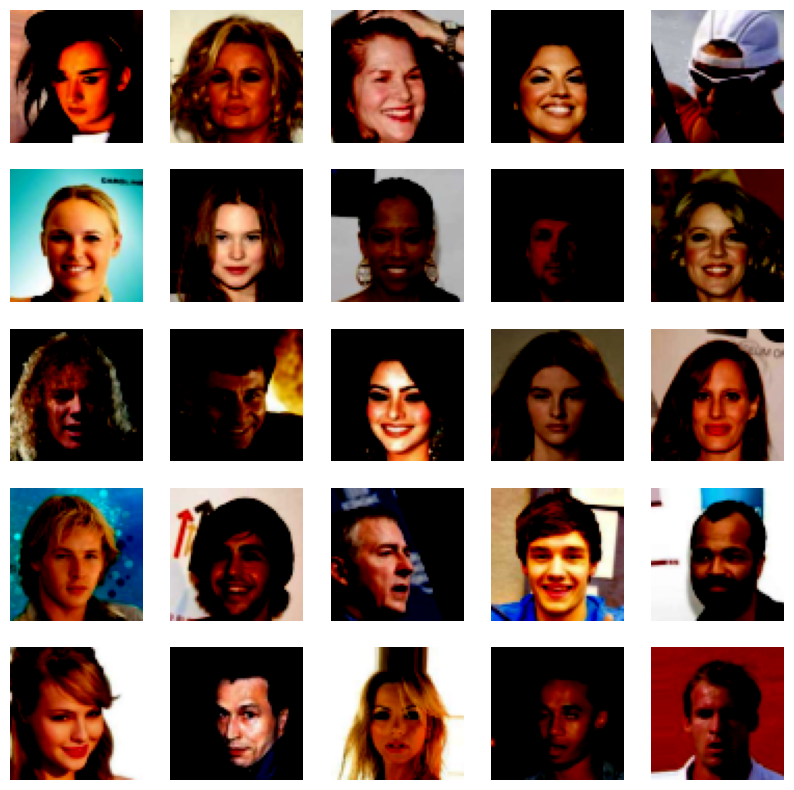

In [14]:
# Visualize the pre-corruption data
plt.figure(figsize=(10, 10))
for i in range(25):
    plt.subplot(5, 5, i+1)
    plt.imshow(np.clip(imgs[i].numpy().transpose(1, 2, 0), 0, 1))
    plt.axis('off')
plt.show()

Visualize the corrupted data.

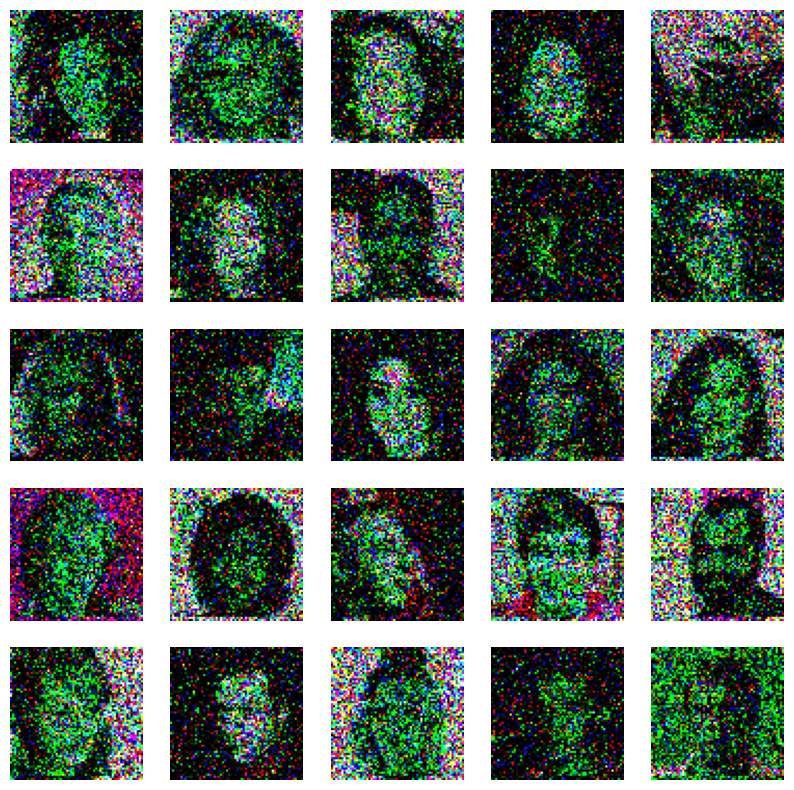

In [15]:
# Visualize the corrupted data
plt.figure(figsize=(10, 10))
for i in range(25):
    plt.subplot(5, 5, i+1)
    plt.imshow(np.clip(corrupted_imgs[i].numpy().transpose(1, 2, 0), 0, 1))
    plt.axis('off')
plt.show()

In [16]:
# Initialize and train the model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
noise_dim = 100

generator = CelebA_Generator(noise_dim).to(device)
discriminator = CelebA_Discriminator().to(device)
corruptor = Corruptor(corruption_types=['mask', 'gaussian_noise'])
gan = AmbientGAN(generator, discriminator, corruptor, noise_dim, corrupt=True, output_dir='out/celeba_out')

fixed_noise = torch.randn(64, noise_dim, 1, 1, device=device)
gan.fixed_noise = fixed_noise

d_losses, g_losses = gan.train(data_loader, epochs=50, device=device)

[Epoch 0/50] [Batch 0/3166] [D loss: 0.6999005079269409] [G loss: 0.6903564929962158]
[Epoch 0/50] [Batch 100/3166] [D loss: 0.4434068202972412] [G loss: 1.5185359716415405]
[Epoch 0/50] [Batch 200/3166] [D loss: 0.46984049677848816] [G loss: 1.4199339151382446]
[Epoch 0/50] [Batch 300/3166] [D loss: 0.3683766722679138] [G loss: 1.7828011512756348]
[Epoch 0/50] [Batch 400/3166] [D loss: 0.382626473903656] [G loss: 2.030409812927246]
[Epoch 0/50] [Batch 500/3166] [D loss: 0.6610331535339355] [G loss: 1.0018033981323242]
[Epoch 0/50] [Batch 600/3166] [D loss: 0.31385695934295654] [G loss: 1.752748966217041]
[Epoch 0/50] [Batch 700/3166] [D loss: 0.5500746965408325] [G loss: 1.2364411354064941]
[Epoch 0/50] [Batch 800/3166] [D loss: 0.5576386451721191] [G loss: 1.3116573095321655]
[Epoch 0/50] [Batch 900/3166] [D loss: 0.5027186870574951] [G loss: 1.1934565305709839]
[Epoch 0/50] [Batch 1000/3166] [D loss: 0.49470973014831543] [G loss: 1.1862943172454834]
[Epoch 0/50] [Batch 1100/3166] [D

KeyboardInterrupt: 

## Training on Mouse fUSi Data

Note that this data cannot be made available online.

In [21]:
sys.path.append('../')
import utilsS
import datasetloader

# Hyperparameters
noise_dim = 100
epochs = 150
lr = 0.0002
num_frames = 1

crop_dim = [128, 128]
batch_size = 64
data_path_train = "/home/aditijc/data_onemouse/MousefUSi-data/data_300/data300_oneAnimalOut_Mouse2ABR/train"
num_frames = 32
iq_signal_mode = 'real'
standardization_constant_path = "/home/aditijc/data_onemouse/MousefUSi-data/data_300/data300_oneAnimalOut_Mouse2ABR/train_real_32_128_withtransformation_scalar_standardization_constant.pt"
standardization_constant = torch.load(standardization_constant_path)
# only to scale all by one scalar value
standardization_constant["iq_mean"] = torch.mean(
    standardization_constant["iq_mean"]
)

standardization_constant["iq_std"] = torch.mean(
    standardization_constant["iq_std"]
)
standardization_constant["dop_mean"] = torch.mean(
    standardization_constant["dop_mean"]
)
standardization_constant["dop_std"] = torch.mean(
    standardization_constant["dop_std"]
)

transform_train = [
    utilsS.FUSCenterCrop(
        crop_dim,
    )
    ]

train_dataset = datasetloader.FUSdataset_S_L(
        data_path_train,
        num_frames=num_frames,
        iq_signal_mode=iq_signal_mode,
        standardization_constant=standardization_constant,
        transform=transform_train,
    )

train_loader = torch.utils.data.DataLoader(
        train_dataset,
        shuffle=True,
        batch_size=batch_size,
    )

In [22]:
noise_types = ['mask', \
               'gaussian_noise', \
               'speckle_noise', \
               'thermal_noise', \
               'poisson_noise', \
              #  'quantization_noise', \
               'motion_artifacts', \
              #  'reverberation_artifacts'\
               ]
# Initialize models
generator = fUSi_Generator(noise_dim, num_frames)
discriminator = fUSi_Discriminator(num_frames)
corruptor = Corruptor(corruption_types=noise_types)
gan = AmbientGAN(generator, discriminator, corruptor, noise_dim, corrupt=False, output_dir='out/fusi_out')

torch.Size([64, 128, 128, 32])


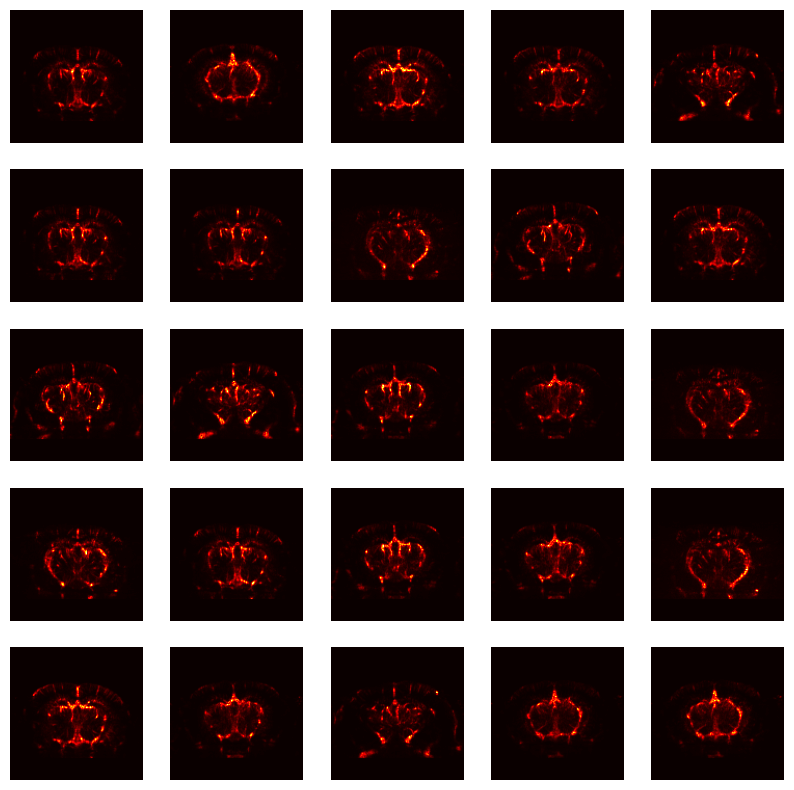

In [23]:
# Get a batch of data
data_iter = iter(train_loader)
iq, s, dop, _ = next(data_iter)
imgs = s
print(imgs.shape)


# Visualize the data
plt.figure(figsize=(10, 10))
for i in range(25):
    plt.subplot(5, 5, i+1)
    plt.imshow(np.mean(imgs[i].numpy(), axis=2).reshape(128, 128), cmap='hot')
    plt.axis('off')
plt.show()


In [24]:
# Train the GAN
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
generator.to(device)
discriminator.to(device)

d_losses, g_losses = gan.train(train_loader, epochs, device)


[Epoch 0/150] [Batch 0/11] [D loss: 0.7694563865661621] [G loss: 0.6346114873886108]
torch.Size([33, 1, 128, 128])
[Epoch 1/150] [Batch 0/11] [D loss: 0.010124552994966507] [G loss: 4.678135871887207]
torch.Size([33, 1, 128, 128])
[Epoch 2/150] [Batch 0/11] [D loss: 0.00868652667850256] [G loss: 5.20572566986084]
torch.Size([33, 1, 128, 128])
[Epoch 3/150] [Batch 0/11] [D loss: 0.0029653292149305344] [G loss: 6.1772027015686035]


KeyboardInterrupt: 